<center><h1>In your face:<br>Biased judgement of fear-anger expressions in violence offenders.</h1></center>

# 4. Basic Plotting and Statistics for morphed faces

### import libraries

In [1]:
import numpy as np
import pandas as pd

import os
import fnmatch

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from myBasics import *

In [2]:
bigDf = pd.read_csv('../outputs/genderTable.csv',
                    index_col=[0,1,2])

In [3]:
bigDf.head()

00    01    02   03    04    05    06    07    08    09  \
g p    fgender                                                              
A A001 F        0.00  0.10  0.10  0.2  0.15  0.30  0.85  0.90  0.90  1.00   
       M        0.00  0.10  0.20  0.2  0.25  0.50  0.70  0.85  0.95  1.00   
  A002 F        0.20  0.10  0.05  0.3  0.25  0.50  0.75  0.90  0.75  1.00   
       M        0.05  0.25  0.35  0.2  0.35  0.55  0.60  0.90  0.85  1.00   
  A003 F        0.00  0.05  0.15  0.1  0.30  0.40  0.55  0.65  0.65  0.65   

                  10  group  
g p    fgender               
A A001 F        1.00      2  
       M        1.00      2  
  A002 F        1.00      2  
       M        1.00      2  
  A003 F        0.85      2

### One plot for each face gender

In [4]:
def makeGenderSpaghetti(bigDf,cond,count):
    
    ax = plt.subplot(1,2,count)
    
    # to loop through all cases but have only one legend without redundancies,
    # here we keep track of whether a condition is already labeled
    legTrack = []
    
    # looping  through the 3 groups
    for group in bigDf.index.levels[0]:
        # looping through the participants of each group
        for p in bigDf.ix[group].index:
            if p[0][0] in group:
                
                # color and legend setting for that group
                thisCol = myPal[labelCoding[p[0][0]]]
                thisLeg = myGLabels[p[0][0]]
                
                # get the data from the specified row
                thisList = list(bigDf.ix[group].ix[p[0]].ix[cond])[:-1] # last row is group membership; get rid of that

                # plotting with legend if this is the first instance,
                # otherwise plot without a legend
                if thisLeg not in legTrack:
                    ax.plot(thisList,
                            c=thisCol,
                            alpha=0.5,
                            linewidth=4,
                            label=thisLeg)
                else:
                    ax.plot(thisList,
                            c=thisCol,
                            linewidth=4,
                            alpha=0.5)            
                # keep track which conditions already have a legend
                legTrack.append(thisLeg)
        
    # plot formatting

    ax.set_xlabel('Morphing Grade (Fear --> Anger)')
    ax.set_ylabel('% Anger Responses')

    plt.xticks(np.arange(0,10.1,2), [str(a)+'%' for a in  np.arange(0,101,20)])
    plt.yticks(np.arange(0,1.01,0.2), [str(a)+'%' for a in  np.arange(0,101,20)])

    #plt.ylim(.0,1.); plt.xlim(-0.1,10.2)
    if cond == 'M':
        ax.set_title('Male Faces')
    elif cond == 'F':
        ax.set_title('Female Faces')
        ax.set_ylabel('')
        ax.set_yticks([])
        # one legend for both plots
        plt.legend(loc='best',bbox_to_anchor=[1.1, 1])

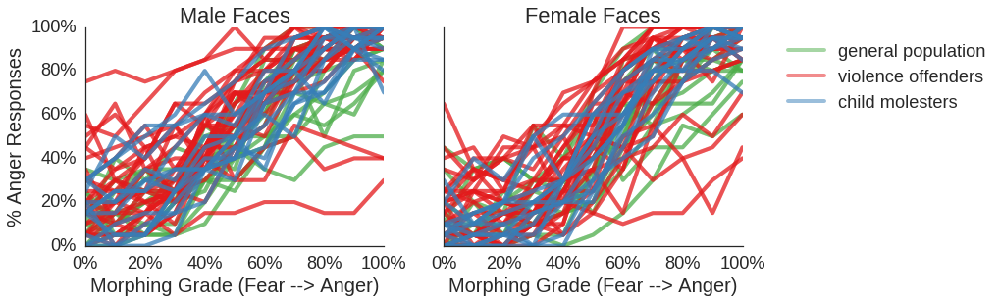

In [5]:
plt.figure(figsize=(12,4))
for i,fgender in enumerate(['M','F']):
    makeGenderSpaghetti(bigDf,fgender,i+1)
    sns.despine()
#plt.savefig('../figures/rawSpaghettiAll.png',dpi=300,bbox_inches="tight")
plt.show()

Same thing, but as interactive plot

In [6]:
def interactiveSpaghetti(i):
    
    mmDf = bigDf[1::2]
    mDf = mmDf[mmDf.columns[:-1]]
    mY = list( mmDf['group'] )
    
    ffDf = bigDf[0::2]
    fDf = ffDf[ffDf.columns[:-1]]
    fY = list( ffDf['group'])
  
    
    fig = plt.figure(figsize=(12,4))
    
    ### male
    ax = plt.subplot(1,2,1)
    
    selectDf = mDf.ix[i]
    otherDf = np.array( pd.concat([mDf[:i],mDf[i+1:] ] ) )
        
    for entry in range(otherDf.shape[0]):
        try: ax.plot(otherDf[entry],alpha=0.5,color=myPal[mY[entry]])
        except: print "!"
            
    ax.plot(selectDf,linewidth=10,color=myPal[mY[i]])
    
    ### female
    ax = plt.subplot(1,2,2)
    
    selectDf = fDf.ix[i]
    otherDf = np.array( pd.concat([fDf[:i],fDf[i+1:] ] ) )
        
    for entry in range(otherDf.shape[0]):
        try: ax.plot(otherDf[entry],alpha=0.5,color=myPal[fY[entry]])
        except: print "!"
            
    ax.plot(selectDf,linewidth=10,color=myPal[fY[i]])
    sns.despine()
    
    return fig

In [7]:
# Interactive plots for static html notebooks; using ipywidgets by Jake Vanderplas  
# https://github.com/jakevdp/ipywidgets-static

from ipywidgets_static import StaticInteract, RangeWidget, RadioWidget

In [8]:
StaticInteract(interactiveSpaghetti,
               i=RangeWidget(0, 60, 1)
              )

/opt/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


### get rid of outliers

Here, some participants are removed whose response functions indicate guessing or non-compliance.  
We also visualise the data of the excluded participants here, to make clear why they had to be excluded.

In [9]:
eliminated = ['G011','G013','G016','G025','A004']

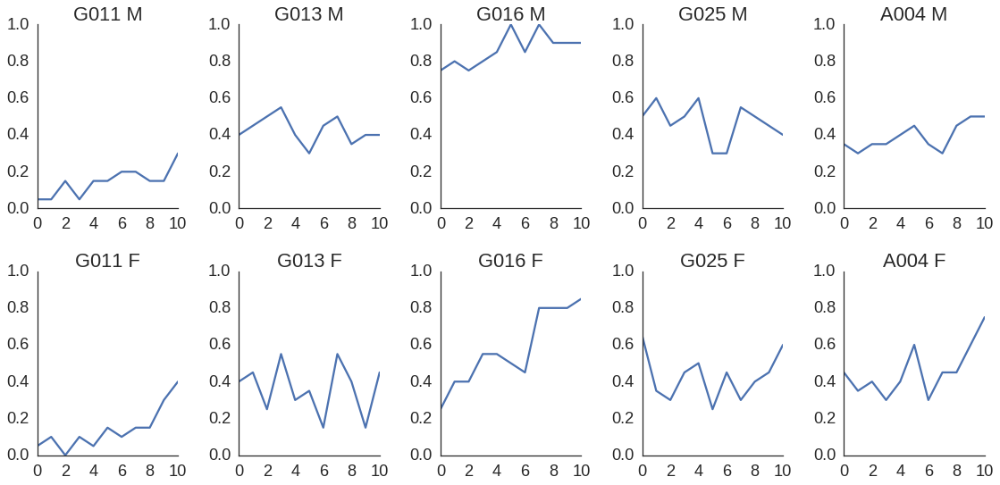

In [10]:
fig = plt.figure(figsize=(16,8))
for e,elim in enumerate(eliminated):
    ax = plt.subplot(2,len(eliminated),e+1)
    ax.plot( bigDf.ix[elim[0]].ix[elim].ix['M'][:-1] )
    ax.set_title(elim+' M')
    ax.set_ylim(0,1)
for e,elim in enumerate(eliminated):
    ax = plt.subplot(2,len(eliminated),len(eliminated)+e+1)
    ax.plot( bigDf.ix[elim[0]].ix[elim].ix['F'][:-1] )
    ax.set_title(elim+' F')
    ax.set_ylim(0,1)
    sns.despine()
plt.tight_layout()
plt.show()


### plot cleaned up data

In [11]:
for elim in eliminated:
    bigDf.drop([elim],level=1, inplace=True)

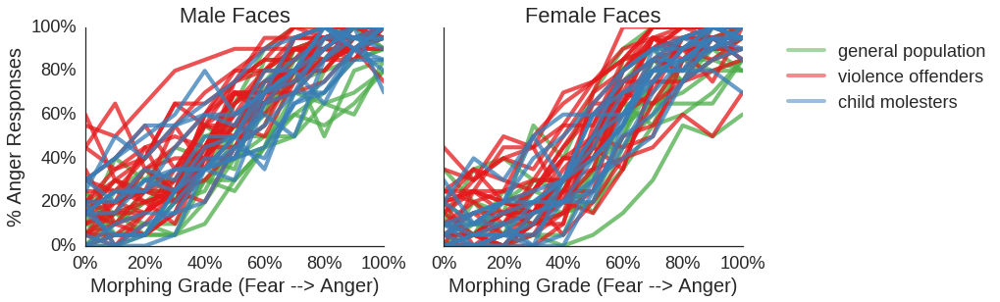

In [12]:
plt.figure(figsize=(12,4))
for i,fgender in enumerate(['M','F']):
    makeGenderSpaghetti(bigDf,fgender,i+1)
    sns.despine()
#plt.savefig('../figures/rawSpaghetti.png',dpi=300,bbox_inches="tight")
plt.show()

Changing the structure of the DataFrame to easily average over group

In [13]:
genderDf = bigDf.unstack(0).unstack(0).stack(1).stack(1)

In [14]:
genderDf.head()

00    01    02    03    04    05    06    07    08    09  \
fgender g p                                                                  
F       A A001  0.00  0.10  0.10  0.20  0.15  0.30  0.85  0.90  0.90  1.00   
          A002  0.20  0.10  0.05  0.30  0.25  0.50  0.75  0.90  0.75  1.00   
          A003  0.00  0.05  0.15  0.10  0.30  0.40  0.55  0.65  0.65  0.65   
          A005  0.35  0.20  0.15  0.55  0.40  0.70  0.90  1.00  1.00  1.00   
          A006  0.00  0.20  0.05  0.25  0.20  0.35  0.65  0.55  0.85  0.85   

                  10  group  
fgender g p                  
F       A A001  1.00      2  
          A002  1.00      2  
          A003  0.85      2  
          A005  1.00      2  
          A006  0.95      2

In [15]:
# get rid of group column
genderDf = genderDf[genderDf.columns[:-1]]

In [16]:
genderDf.head()

00    01    02    03    04    05    06    07    08    09  \
fgender g p                                                                  
F       A A001  0.00  0.10  0.10  0.20  0.15  0.30  0.85  0.90  0.90  1.00   
          A002  0.20  0.10  0.05  0.30  0.25  0.50  0.75  0.90  0.75  1.00   
          A003  0.00  0.05  0.15  0.10  0.30  0.40  0.55  0.65  0.65  0.65   
          A005  0.35  0.20  0.15  0.55  0.40  0.70  0.90  1.00  1.00  1.00   
          A006  0.00  0.20  0.05  0.25  0.20  0.35  0.65  0.55  0.85  0.85   

                  10  
fgender g p           
F       A A001  1.00  
          A002  1.00  
          A003  0.85  
          A005  1.00  
          A006  0.95

In [17]:
def makePlot(genderDf,groups):
    plt.figure(figsize=(12,4))

    for count,gender in enumerate( genderDf.index.levels[0][::-1] ):

        ax = plt.subplot(1,2,count+1)

        for j,group in enumerate( groups ):

            thisMean = genderDf.ix[gender].ix[group].mean()
            thisStd = genderDf.ix[gender].ix[group].std(ddof=1)

            thisCol = myPal[labelCoding[group]]
            thisLeg = myGLabels[group]
            
            plt.errorbar( np.linspace(0,10,len(thisMean))+j/15., # apply small shift so CI are better visible
                          thisMean,
                          yerr=thisStd/np.sqrt(len(genderDf.ix[gender].ix[group]) )*1.96,

                          label=thisLeg,
                          color=thisCol,
                          linewidth=3,
                          alpha=0.7
                        )

        # plot formatting

        ax.set_xlabel('Morphing Grade (Fear --> Anger)')
        ax.set_ylabel('% Anger Responses')

        plt.xticks(np.arange(0,10.1,2), [str(a)+'%' for a in  np.arange(0,101,20)])
        plt.yticks(np.arange(0,1.01,0.2), [str(a)+'%' for a in  np.arange(0,101,20)])

        plt.ylim(-0.02,1.02); plt.xlim(-0.1,10.2)
        if gender == 'M':
            ax.set_title('Male Faces')
        elif gender == 'F':
            ax.set_title('Female Faces')
            ax.set_ylabel('')
            ax.set_yticks([])
            # one legend for both plots
            plt.legend(loc='best',bbox_to_anchor=[1, 1])

    #plt.show()

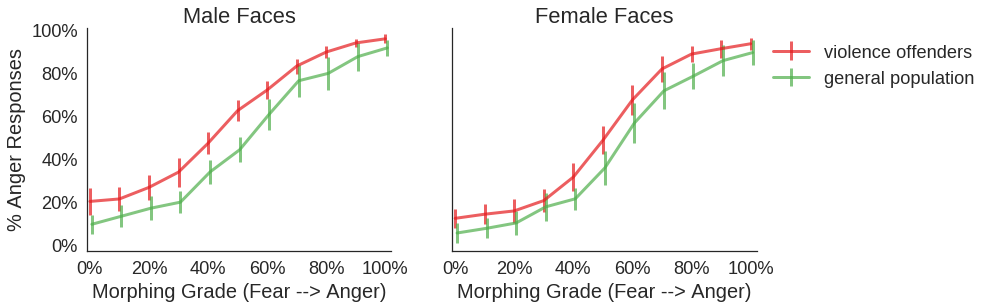

In [18]:
makePlot(genderDf,['G','A'])
sns.despine()
#plt.savefig('../figures/meanGenderPlotViolenceGeneral.png',dpi=300,bbox_inches="tight")
plt.show()

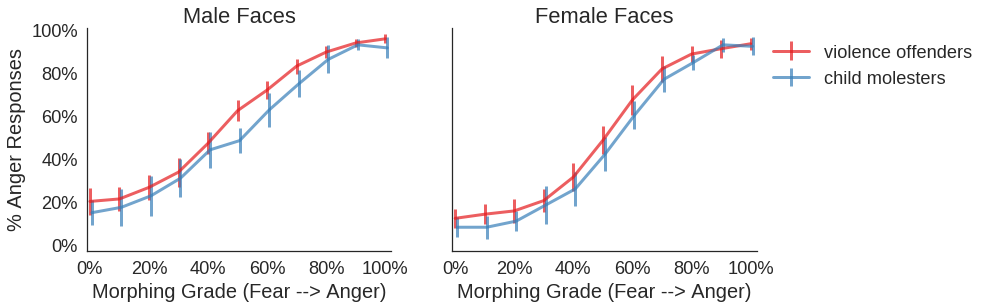

In [19]:
makePlot(genderDf,['G','K'])
sns.despine()
#plt.savefig('../figures/meanGenderPlotViolenceMolesters.png',dpi=300,bbox_inches="tight")
plt.show()

### Restructure for seaborn plots

In [20]:
genderStacked = genderDf.unstack(0).stack(0).unstack(2)

In [21]:
groupCol = []
for entry in genderStacked.index.levels[1]:
    try:
        genderStacked.ix[entry[0]].ix[entry]
        groupCol.append(labelCoding[entry[0]] )
    except:
        print entry # previously eliminated cases are excluded
genderStacked['group'] = groupCol

In [22]:
genderStacked.head()

fgender     F                                                        ...   \
           00    01    02    03    04    05    06    07    08    09  ...    
g p                                                                  ...    
A A001   0.00  0.10  0.10  0.20  0.15  0.30  0.85  0.90  0.90  1.00  ...    
  A002   0.20  0.10  0.05  0.30  0.25  0.50  0.75  0.90  0.75  1.00  ...    
  A003   0.00  0.05  0.15  0.10  0.30  0.40  0.55  0.65  0.65  0.65  ...    
  A005   0.35  0.20  0.15  0.55  0.40  0.70  0.90  1.00  1.00  1.00  ...    
  A006   0.00  0.20  0.05  0.25  0.20  0.35  0.65  0.55  0.85  0.85  ...    

fgender     M                                                 group  
           02    03    04    05    06    07    08    09    10        
g p                                                                  
A A001   0.20  0.20  0.25  0.50  0.70  0.85  0.95  1.00  1.00     2  
  A002   0.35  0.20  0.35  0.55  0.60  0.90  0.85  1.00  1.00     2  
  A003   0.05  0.05  0.30  0.25  0.45  0.50  0.80  0.95  0.95     2  
  A005   0.30  0.45  0.40  0.65  0.90  1.00  1.00  1.00  1.00     2  
  A006   0.30  0.30  0.45  0.50  0.85  0.85  0.90  0.90  1.00     2  

[5 rows x 23 columns]

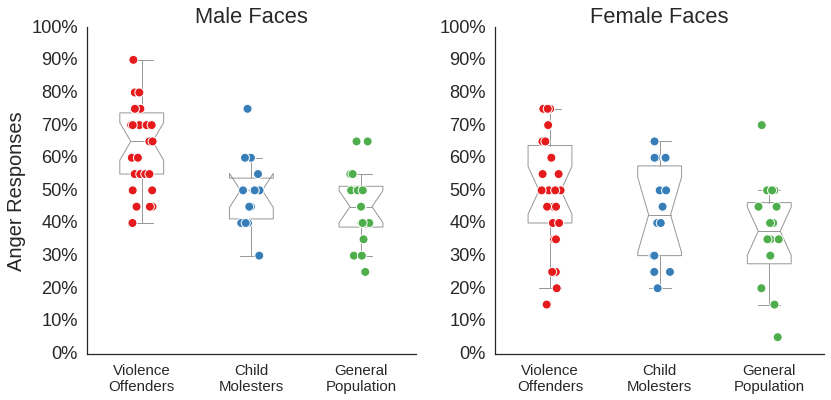

In [23]:
fig = plt.figure(figsize=(12,6))

for i,fGender in enumerate(['M','F']):
    ax = fig.add_subplot('12'+str(i+1))

    sns.boxplot(x='group',y=(fGender,'05'),data=genderStacked,
                    width=0.4,linewidth=1,color='white',whis=True,notch=True,fliersize=0,ax=ax)
    sns.stripplot(x='group',y=(fGender,'05'),data=genderStacked,
                      jitter=True, edgecolor='white',palette=myPal,size=9,linewidth=1,ax=ax)

    if fGender == 'M':
        ax.set_title('Male Faces')
    else :
        ax.set_title('Female Faces')        
        
    ax.set_ylim(0,1)
    ax.set_xticklabels(['Violence\nOffenders','Child\nMolesters','General\nPopulation'],fontsize=15)
    ax.set_xlabel('')
    if i==0:
        ax.set_ylabel('Anger Responses')
    else:
        ax.set_ylabel('')
    sns.despine()
    plt.yticks(np.arange(0,1.01,0.1), [str(a)+'%' for a in  np.arange(0,101,10)])
#plt.suptitle('Threshold of fitted function',fontsize=20, position=(0.51,1.1))
plt.tight_layout()
#plt.savefig('../figures/fifty_fifty.png',dpi=300)
plt.show()

### inferential statistics

In [24]:
from scipy import stats

In [25]:
def makeMannUTests(df):
    bigDf = pd.DataFrame()
    d = {}
    for comp in [('G','K'),('G','A'),('K','A')]:
        for variable in df.columns:
            group1 = df.ix[comp[0]][variable]
            group2 = df.ix[comp[1]][variable]
            U,p = stats.mannwhitneyu(group1,group2)
            if p<0.05:
                thisSig = '*'
            else:
                thisSig = 'n.s.'
            d[variable] = {'U':round(U,2),'p':round(p,3),'sig':thisSig}
        thisDf = pd.DataFrame(d)
        thisDf = thisDf.reindex_axis(['U','p','sig'], axis=0)
        thisDf.index = [ [comp[0]+' > '+comp[1]]*len(thisDf.index),thisDf.index ]

        bigDf = pd.concat([bigDf,thisDf])
    return bigDf.T

In [26]:
makeMannUTests(genderDf.unstack(0))[1::2]

G > K               G > A               K > A             
          U      p   sig      U      p   sig      U      p   sig
00 M  207.5  0.473  n.s.  293.5  0.026     *  144.5  0.177  n.s.
01 M  211.5  0.408  n.s.  280.5   0.06  n.s.    123  0.659  n.s.
02 M  207.5  0.475  n.s.  283.5   0.05  n.s.  131.5  0.424  n.s.
03 M  195.5  0.709  n.s.    312  0.007     *  156.5  0.064  n.s.
04 M    218  0.309  n.s.  325.5  0.002     *    155  0.073  n.s.
05 M  286.5  0.003     *  352.5      0     *  133.5  0.377  n.s.
06 M    244  0.077  n.s.    302  0.015     *    122  0.691  n.s.
07 M  255.5  0.036     *  250.5  0.271  n.s.     96  0.516  n.s.
08 M  196.5  0.686  n.s.  286.5  0.039     *    143    0.2  n.s.
09 M  201.5  0.572  n.s.    252  0.241  n.s.    128  0.507  n.s.
10 M    227  0.167  n.s.    279  0.049     *    118  0.812  n.s.

In [27]:
makeMannUTests(genderDf.unstack(0))[::2]

G > K               G > A               K > A             
          U      p   sig      U      p   sig      U      p   sig
00 F    218  0.306  n.s.    290   0.03     *    140   0.23  n.s.
01 F  228.5  0.185  n.s.    264  0.142  n.s.    117  0.847  n.s.
02 F    206    0.5  n.s.    252  0.254  n.s.    124  0.626  n.s.
03 F    201  0.597  n.s.    238  0.438  n.s.  110.5  0.967  n.s.
04 F    209  0.448  n.s.    273  0.092  n.s.    132    0.4  n.s.
05 F  222.5  0.254  n.s.    298   0.02     *    136  0.326  n.s.
06 F    238  0.114  n.s.  276.5  0.077  n.s.    126  0.572  n.s.
07 F  234.5  0.138  n.s.    284  0.049     *  130.5   0.45  n.s.
08 F  240.5  0.095  n.s.    313  0.006     *    146  0.158  n.s.
09 F    178  0.918  n.s.  254.5   0.22  n.s.  141.5  0.216  n.s.
10 F    202   0.56  n.s.    240  0.391  n.s.  118.5  0.796  n.s.

### save with new header, for ANOVA in JASP

In [28]:
jaspGender = genderDf.unstack(0)
jaspGender.columns = jaspGender.columns.swaplevel(0, 1)
jaspGender.sortlevel(0, axis=1, inplace=True)
jaspGender.columns = ['fm'[jaspGender.columns.labels[0][x]]+'_'+str(jaspGender.columns.labels[1][x]) for x in range(jaspGender.shape[1]) ]

In [29]:
jaspGender.head()

f_0   f_1   f_2   f_3   f_4   f_5   f_6   f_7   f_8   f_9  ...   \
g p                                                                 ...    
A A001  0.00  0.10  0.10  0.20  0.15  0.30  0.85  0.90  0.90  1.00  ...    
  A002  0.20  0.10  0.05  0.30  0.25  0.50  0.75  0.90  0.75  1.00  ...    
  A003  0.00  0.05  0.15  0.10  0.30  0.40  0.55  0.65  0.65  0.65  ...    
  A005  0.35  0.20  0.15  0.55  0.40  0.70  0.90  1.00  1.00  1.00  ...    
  A006  0.00  0.20  0.05  0.25  0.20  0.35  0.65  0.55  0.85  0.85  ...    

         m_1   m_2   m_3   m_4   m_5   m_6   m_7   m_8   m_9  m_10  
g p                                                                 
A A001  0.10  0.20  0.20  0.25  0.50  0.70  0.85  0.95  1.00  1.00  
  A002  0.25  0.35  0.20  0.35  0.55  0.60  0.90  0.85  1.00  1.00  
  A003  0.00  0.05  0.05  0.30  0.25  0.45  0.50  0.80  0.95  0.95  
  A005  0.20  0.30  0.45  0.40  0.65  0.90  1.00  1.00  1.00  1.00  
  A006  0.40  0.30  0.30  0.45  0.50  0.85  0.85  0.90  0.90  1.00  

[5 rows x 22 columns]

In [30]:
jaspGender.to_csv('../outputs/genderMorphsJASP.csv')

## Correlation of 50/50 with AFAS

Get the AFAS data

In [31]:
afasDf = pd.read_csv('../outputs/meanAFAS.csv',index_col=[0,1])

Get rid of the participants that were excluded from the morphing task

In [32]:
for elim in eliminated:
    afasDf.drop([elim],level=1, inplace=True)

In [33]:
afasDf.head()

Facilitative  Appetitive   Overall  group
  id                                             
A A001      1.000000    0.266667  0.633333      2
  A002      0.266667    0.066667  0.166667      2
  A003      0.600000    0.200000  0.400000      2
  A005      1.400000    1.200000  1.300000      2
  A006      0.466667    0.266667  0.366667      2

Merge together:

In [34]:
assert ( afasDf.index == genderStacked.index ).all()

In [35]:
mergeDf = pd.DataFrame([ afasDf['Overall'], genderStacked['M']['05'], afasDf['group'] ]).T

(0, 4)

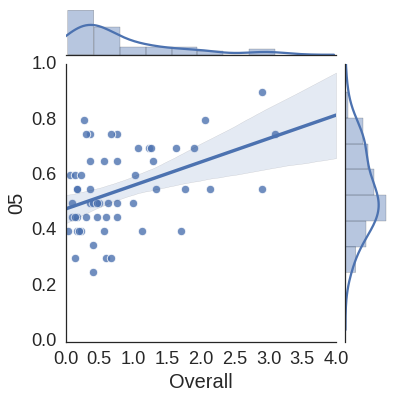

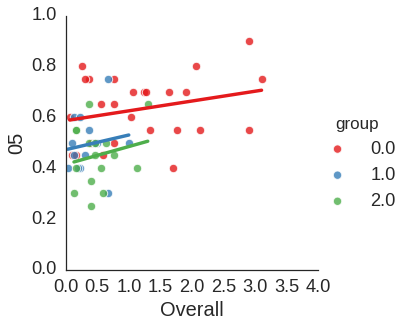

In [36]:
sns.jointplot("Overall", "05", data=mergeDf, kind="reg",
              xlim=(0, 4), ylim=(0, 1),stat_func=None,
              scatter_kws={"s": 70,"edgecolor":"white","linewidth":1}
             )

#plt.savefig('../figures/afasFiftyCorrelationAll.png',dpi=300)


sns.lmplot(x="Overall", y="05", data=mergeDf,hue="group",ci=None,truncate=True,palette=myPal,
           scatter_kws={"s": 70,"edgecolor":"white","linewidth":1}
          )
plt.ylim(0,1);plt.xlim(0,4)
#plt.savefig('../figures/afasFiftyCorrelationGroups.png',dpi=300)

In [44]:
for scale in afasDf.columns[:-1]:
    print "\n",scale
    r, p = stats.spearmanr(afasDf[scale], genderStacked['M']['05'])
    print "Spearman r:",r,"p:",p
    r, p = stats.pearsonr(afasDf[scale], genderStacked['M']['05'])
    print "Pearson r:",r,"p:",p


Facilitative
Spearman r: 0.348177427724 p: 0.00854869903188
Pearson r: 0.423191595328 p: 0.00115564812856

Appetitive
Spearman r: 0.360013818649 p: 0.00642285626403
Pearson r: 0.423972371242 p: 0.00112899301368

Overall
Spearman r: 0.365846912775 p: 0.00555700546699
Pearson r: 0.435032544467 p: 0.000806331193605
